-----------------------------------------------------------------------------------------------------------------------
# **Predicting Patients' No-Show**
-----------------------------------------------------------------------------------------------------------------------

--------------------
## **Context**
--------------------

This project aims to build a model to predict patients' commitment to appointments and understand the underlying reasons behind patients' No-Show appointments. The dataset used to create the model is survey data (63 questions) collected by Ipsos Public Affairs between July and August 2020. The target population consisted of non-institutionalized adults aged 18 and older residing in the United States, with oversamples of African Americans, Hispanics, and adults in low-income households. 

Understanding what influences patients' appointments commitment can result in significant improvements, including: 
1. Resource optimization: When patients do not show up for their scheduled appointments, it underutilizes healthcare resources, such as doctors, nurses, and other support staff, as well as equipment and facilities. By predicting which patients are likely to no-show, healthcare providers can optimize their resources by scheduling appointments for patients who are more likely to show up.

2. Cost reduction: No-shows can result in high costs for healthcare providers. When appointments are not utilized, it leads to lost revenue and wasted resources. Predicting no-shows can help healthcare providers reduce costs by reallocating resources and filling appointment slots that would otherwise go unused.

3. Improved patient outcomes: No-shows can negatively impact patient outcomes, as missed appointments can lead to delayed diagnosis, treatment, and follow-up care. By predicting which patients are likely to no-show, healthcare providers can proactively reach out to patients and encourage them to attend their appointments, thereby improving patient outcomes.

4. Better patient experience: No-shows can frustrate patients and healthcare providers. Patients may become frustrated if they cannot get an appointment when needed, while healthcare providers may become frustrated if they have empty appointment slots. Healthcare providers can improve the patient experience and build trust with their patients by predicting no-shows and taking proactive measures to reduce them.


**Note:** the cleaning process was done seperatly using R.

## **Importing the libraries and overview of the dataset**

In [1]:
# load the libraries
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

# To scale the data using z-score
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

# For corss validation
from sklearn.model_selection import cross_val_score

# Algorithms to use
from sklearn import tree

from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier

# Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report,recall_score,precision_score, accuracy_score

# For tuning the model
from sklearn.model_selection import GridSearchCV

# To plot the tree
from sklearn.tree import plot_tree

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# load the data
df= pd.read_spss("./Data/df_pos_without.sav")

In [3]:
#data type for each column
df.dtypes

duration      float64
DeviceType    float64
weight        float64
xspanish      float64
xacslang      float64
               ...   
Q49bin        float64
Q53bin        float64
Q55bin        float64
Q59bin        float64
ppgndrbin     float64
Length: 158, dtype: object

In [4]:
# checking the first 5 rows
df.head()

,duration,DeviceType,weight,xspanish,xacslang,pphispan,xcom,xfpl100,xzip,Q1,...,Q5bin,Q10bin,Q15bin,Q18bin,Q43bin,Q49bin,Q53bin,Q55bin,Q59bin,ppgndrbin
0,59.33,3.0,1.8664,1.0,5.0,1.0,1.0,2.0,95357.0,3.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
1,32.10,3.0,1.7386,1.0,5.0,1.0,1.0,2.0,77581.0,3.0,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0
2,313.84,10.0,0.3701,1.0,5.0,1.0,2.0,2.0,30291.0,3.0,...,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,14.96,10.0,2.1849,1.0,5.0,1.0,1.0,2.0,60160.0,3.0,...,1.0,2.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
4,24.40,4.0,0.4288,1.0,1.0,8.0,3.0,2.0,77077.0,2.0,...,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0


In [5]:
#checking the dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Columns: 158 entries, duration to ppgndrbin
dtypes: float64(158)
memory usage: 709.9 KB


In [6]:
#checking the number of unique values in each column
df.nunique()

duration      541
DeviceType      9
weight        480
xspanish        2
xacslang        4
             ... 
Q49bin          2
Q53bin          2
Q55bin          3
Q59bin          2
ppgndrbin       2
Length: 158, dtype: int64

**Note** There are no features that are entirly unique.

## **Exploratory Data Analysis and Data Preprocessing** 

### **Univariate analysis of numerical columns**

In [7]:
# Checking summary statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,575.0,57.514383,227.411580,6.1700,19.8650,26.8500,38.62000,3955.6900
DeviceType,575.0,7.133913,3.071928,1.0000,4.0000,8.0000,10.00000,15.0000
weight,575.0,1.031733,0.875325,0.1646,0.3785,0.6941,1.48915,4.5551
xspanish,575.0,1.060870,0.239299,1.0000,1.0000,1.0000,1.00000,2.0000
xacslang,575.0,4.273043,1.348720,1.0000,5.0000,5.0000,5.00000,5.0000
...,...,...,...,...,...,...,...,...
Q49bin,575.0,0.860870,0.346384,0.0000,1.0000,1.0000,1.00000,1.0000
Q53bin,575.0,0.902609,0.296748,0.0000,1.0000,1.0000,1.00000,1.0000
Q55bin,575.0,1.036522,0.409455,0.0000,1.0000,1.0000,1.00000,2.0000
Q59bin,575.0,0.245217,0.430591,0.0000,0.0000,0.0000,0.00000,1.0000


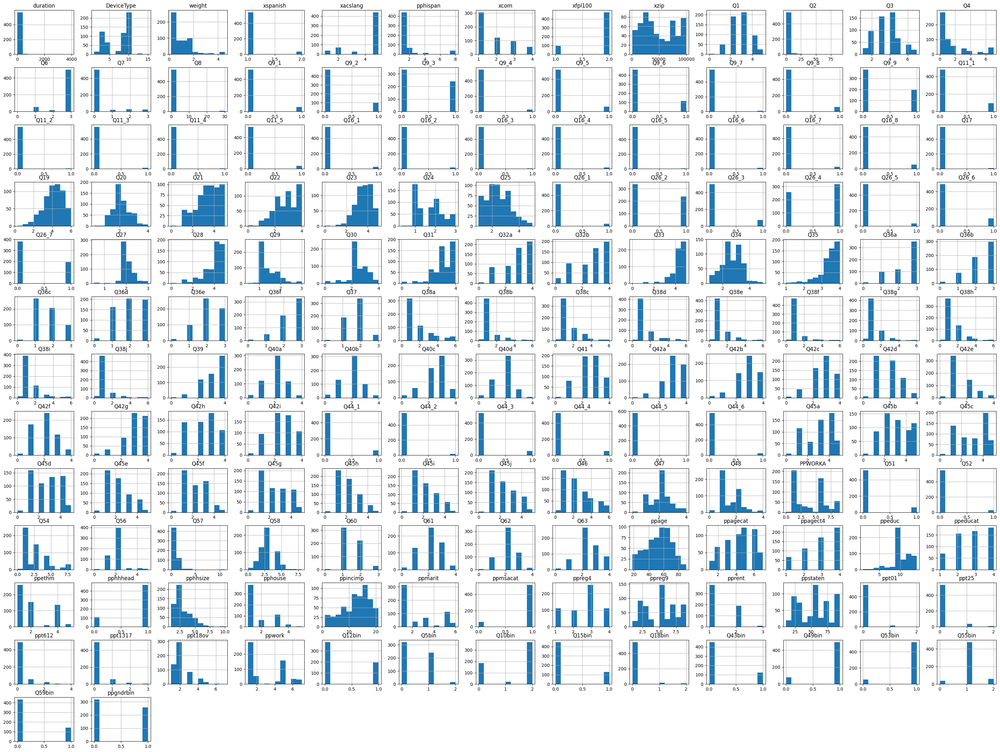

In [8]:
# Creating histograms
df.hist(figsize = (40,30))

plt.show()

<Axes: >

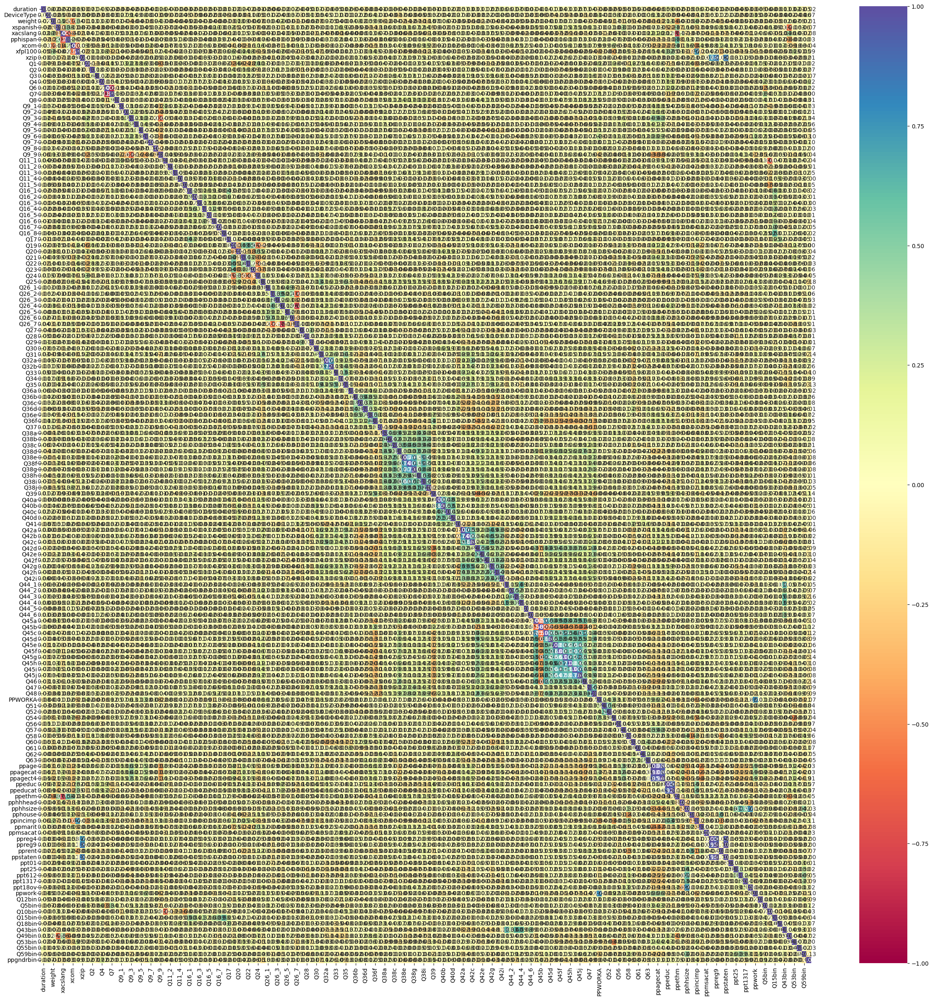

In [9]:

plt.figure(figsize = (30, 30))

sns.heatmap(df.corr(), annot = True, vmin = -1, vmax = 1, fmt = ".2f", cmap = "Spectral")

In [8]:
# Printing the % sub categories of each category.
for i in df.columns:
    
    print(df[i].value_counts(normalize = True))
    
    print('*' * 40)

19.37    0.005217
20.77    0.005217
30.04    0.003478
27.81    0.003478
33.14    0.003478
           ...   
32.99    0.001739
32.36    0.001739
50.41    0.001739
92.41    0.001739
30.26    0.001739
Name: duration, Length: 541, dtype: float64
****************************************
10.0    0.401739
3.0     0.215652
8.0     0.203478
4.0     0.095652
7.0     0.033043
1.0     0.024348
5.0     0.017391
13.0    0.006957
15.0    0.001739
Name: DeviceType, dtype: float64
****************************************
0.2618    0.008696
4.5551    0.008696
0.3066    0.006957
1.3382    0.006957
1.8822    0.006957
            ...   
0.4804    0.001739
1.8373    0.001739
0.2509    0.001739
1.4190    0.001739
0.3295    0.001739
Name: weight, Length: 480, dtype: float64
****************************************
1.0    0.93913
2.0    0.06087
Name: xspanish, dtype: float64
****************************************
5.0    0.763478
2.0    0.125217
1.0    0.064348
3.0    0.046957
Name: xacslang, dtype: float64
*

## **Model Building - Approach**

1. Partition the data into a train and test set.
2. Build a model on the train data.
3. Tune the model if required.
4. Test the data on the test set.

### **Partition the data into train and test**
This step will include seperating the data into:
1. the columns of data that we will use to make classification
2. the columns of data that we want to predict 

we will seperate the independent variables (X) and the dependent variable (Y)

In [9]:
# Separating the target variable and other variables

Y = df.Q12bin

X = df.drop(['Q12bin'], axis = 1)

### **One-Hot-Encoding**
One-hot encoding is a technique used to convert categorical variables into a format that can be used for machine learning models. In one-hot encoding, each categorical variable is represented as a binary vector, with each possible category represented by a single vector dimension. The dimension corresponding to the category is set to 1, and all other dimensions are set to 0.

For example, if we have a categorical variable "color" with three possible categories: red, blue, and green, we would represent it using one-hot encoding as follows:

red -> [1, 0, 0]<br>
blue -> [0, 1, 0]<br>
green -> [0, 0, 1]

Without one-hot encoding, decision trees would not be able to handle categorical variables, and would treat them as continuous variables. This could lead to inaccurate results, as the algorithm would treat the categories as having a natural order or magnitude, even if they do not.

In [10]:
#one hot encoding for positive data
X_encoded = pd.get_dummies(X, columns=['DeviceType','xspanish', 'xacslang', 'pphispan',
                                        'xcom','xfpl100','xzip','Q1','Q3','Q5bin','Q6','Q7',
                                        'Q10bin','Q18bin','Q32a','Q32b','Q36a','Q36b','Q36c','Q36d',
                                        'Q36e','Q36f','Q37','Q38a','Q38b','Q38c','Q38d','Q38e','Q38f',
                                        'Q38g','Q38h','Q38i','Q38j','Q39','Q40a','Q40b','Q40c',
                                        'Q40d','Q41','Q42a','Q42b','Q42c','Q42d','Q42e','Q42f',
                                        'Q42g','Q42h','Q42i','Q45a','Q45b','Q45c','Q45d','Q45e',
                                        'Q45f','Q45g','Q45h','Q45i','Q45j','Q46','PPWORKA',
                                        'Q54', 'Q55bin','Q56','Q60','Q61','Q62','Q63',
                                        'ppagect4','ppeduc','ppeducat','ppethm','pphouse',
                                        'ppincimp','ppmarit','ppmsacat','ppreg4','ppreg9','pprent',
                                        'ppstaten','ppwork','ppagecat']) 

In [11]:
# check the first 5 rows of the x_encoded data
X_encoded.head()

,duration,weight,Q2,Q4,Q8,Q9_1,Q9_2,Q9_3,Q9_4,Q9_5,...,ppwork_5.0,ppwork_6.0,ppwork_7.0,ppagecat_1.0,ppagecat_2.0,ppagecat_3.0,ppagecat_4.0,ppagecat_5.0,ppagecat_6.0,ppagecat_7.0
0,59.33,1.8664,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
1,32.10,1.7386,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
2,313.84,0.3701,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
3,14.96,2.1849,1.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,0,0
4,24.40,0.4288,3.0,7.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1,0,0,0,0,0,0,0,0,1


**Splitting the data into 70% train and 30% test set**

In [12]:
# Splitting the data
x_train, x_test, y_train, y_test = train_test_split(X_encoded, Y, test_size = 0.3, random_state = 1, stratify = Y)

In [13]:
# check the proportion of those who missed the medical service in the original data
sum(Y)/len(Y)

0.3408695652173913

In [14]:
# check the proportion of those who missed the medical service in the training data
sum(y_train)/len(y_train)

0.3407960199004975

In [15]:
## check the proportion of those who missed the medical service in the test data
sum(y_test)/len(y_test)

0.34104046242774566

**Verify that using stratify, we have the same proportion of the outcome**

### **Model evaluation criterion**

**The model can make two types of wrong predictions:**

1. Predicting an patient will show up to the appointment when the patient doesn't show up
2. Predicting an patient will not show up to the appointment when the patient actually shows up

**Creating a function to calculate and print the classification report and confusion matrix**

In [16]:
# Creating metric function

def metrics_score(actual, predicted):
    
    print(classification_report(actual, predicted))
    
    cm = confusion_matrix(actual, predicted)
    
    plt.figure(figsize = (8, 5))
    
    sns.heatmap(cm, annot = True, fmt = '.2f', xticklabels = ['Did not Miss', 'Missed'], yticklabels = ['Did not Miss', 'Missed'])
    plt.ylabel('Actual')
    
    plt.xlabel('Predicted')
    
    plt.show()

In [17]:
def model_performance_classification(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    
    predictors: independent variables
    
    target: dependent variable
    """

    # Predicting using the independent variables
    pred = model.predict(predictors)

    recall = recall_score(target, pred,average = 'macro')                 # To compute recall
    
    precision = precision_score(target, pred, average = 'macro')              # To compute precision
               
    acc = accuracy_score(target, pred)                                 # To compute accuracy score
    

    # Creating a dataframe of metrics
    
    df_perf = pd.DataFrame(
        {
            "Precision":  precision,
            "Recall":  recall,
            "Accuracy": acc,
        },
        
        index = [0],
    )

    return df_perf

## **Building the model**

We will be building 3 different models:

- **Decision Tree**
- **Random Forest**
- **XGBoost**


### **Building the Random Forest Model**

**Random Forest is a bagging algorithm where the base models are Decision Trees.** Samples are taken from the training data and on each sample, a decision tree makes a prediction. 

**The results from all the decision trees are combined and the final prediction is made using voting (for classification problems) or averaging (for regression problems).**

In [18]:
# Fitting the Random Forest classifier on the training data
rf = RandomForestClassifier(class_weight = {1: 0.43, 0: 0.66}, random_state = 1)

rf.fit(x_train, y_train)

RandomForestClassifier(class_weight={0: 0.66, 1: 0.43}, random_state=1)

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       265
         1.0       1.00      1.00      1.00       137

    accuracy                           1.00       402
   macro avg       1.00      1.00      1.00       402
weighted avg       1.00      1.00      1.00       402



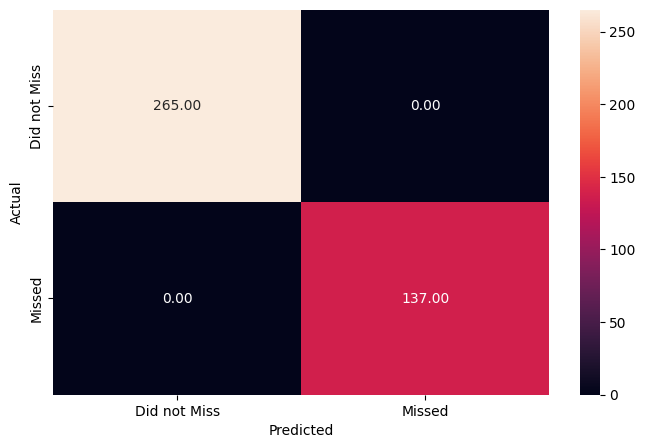

In [19]:
# Checking performance on the training data
y_pred_train_rf = rf.predict(x_train)

metrics_score(y_train, y_pred_train_rf)

              precision    recall  f1-score   support

         0.0       0.66      0.97      0.79       114
         1.0       0.50      0.05      0.09        59

    accuracy                           0.66       173
   macro avg       0.58      0.51      0.44       173
weighted avg       0.61      0.66      0.55       173



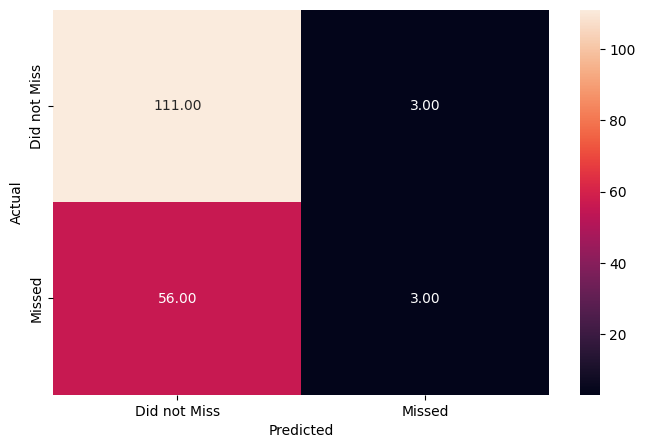

In [20]:
# Checking performance on the testing data
y_pred_test_rf = rf.predict(x_test)

metrics_score(y_test, y_pred_test_rf)

In [21]:
rf_estimator_test = model_performance_classification(rf,x_test,y_test)
rf_estimator_test

,Precision,Recall,Accuracy
0,0.582335,0.512266,0.65896


In [22]:
# find the probability of prediction from each individual tree
y_train_prob_tree = np.stack([m.predict_proba(x_train)[:,1] for m in rf.estimators_])
y_valid_prob_tree = np.stack([m.predict_proba(x_test)[:,1] for m in rf.estimators_])

# Find AUC for different levels of Trees
train_auc_trees = [metrics.roc_auc_score(y_train, (y_train_prob_tree[:i+1].mean(0) > 0.5).astype(int)) for i in range(100)]
test_auc_trees = [metrics.roc_auc_score(y_test, (y_valid_prob_tree[:i+1].mean(0) > 0.5).astype(int)) for i in range(100)]

len(train_auc_trees), len(test_auc_trees)

(100, 100)

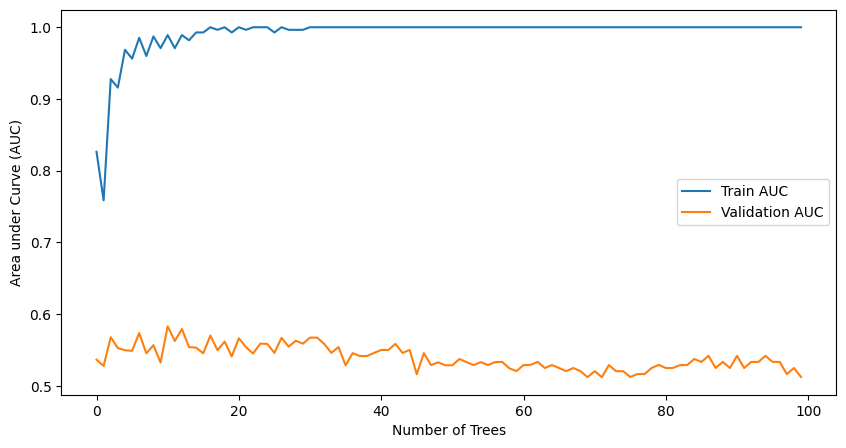

In [23]:
plt.figure(figsize=(10,5))

plt.plot(train_auc_trees, label='Train AUC')
plt.plot(test_auc_trees, label='Validation AUC')

plt.ylabel('Area under Curve (AUC)')
plt.xlabel('Number of Trees')

plt.legend()
plt.show()

**check the feature importance of the Random Forest**

here


<Axes: xlabel='Importance'>

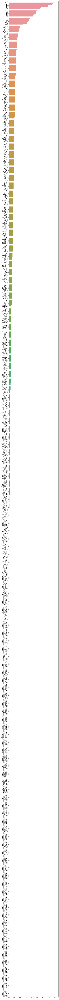

In [24]:
importances = rf.feature_importances_
print('here')
columns = X_encoded.columns
importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
# importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)
plt.figure(figsize = (10, 200))

sns.barplot(x= importance_df.Importance, y= importance_df.index)

### **Tuning the Random Forest classifier**

**n_estimators**: The number of trees in the forest.

**max_features{“auto”, “sqrt”, “log2”, 'None'}**: The number of features to consider when looking for the best split.

- If “auto”, then max_features=sqrt(n_features).

- If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).

- If “log2”, then max_features=log2(n_features).

- If None, then max_features=n_features.

**max_depth**: The maximum depth of the tree

In [25]:
# Choose the type of classifier
rf_tuned = RandomForestClassifier(class_weight = {1: 0.43, 0: 0.66}, random_state = 1)

# Grid of parameters to choose from
params_rf = {  
        "n_estimators": [5,10,15,20],
        "max_features": ['sqrt', 'log2', 1, 0.7],
        "max_depth": [6,7,8,9,10],
}


# Type of scoring used to compare parameter combinations - recall score for class 1
scorer = metrics.make_scorer(recall_score, pos_label = 1)

# Run the grid search
grid_obj = GridSearchCV(rf_tuned, params_rf, scoring = scorer, cv = 5)

grid_obj = grid_obj.fit(x_train, y_train)

# Set the classifier to the best combination of parameters
rf_tuned = grid_obj.best_estimator_ 

# Fit the best algorithm to the data.
rf_tuned.fit(x_train, y_train)

RandomForestClassifier(class_weight={0: 0.66, 1: 0.43}, max_depth=9,
                       max_features=0.7, n_estimators=10, random_state=1)

              precision    recall  f1-score   support

         0.0       0.87      1.00      0.93       265
         1.0       1.00      0.70      0.82       137

    accuracy                           0.90       402
   macro avg       0.93      0.85      0.88       402
weighted avg       0.91      0.90      0.89       402



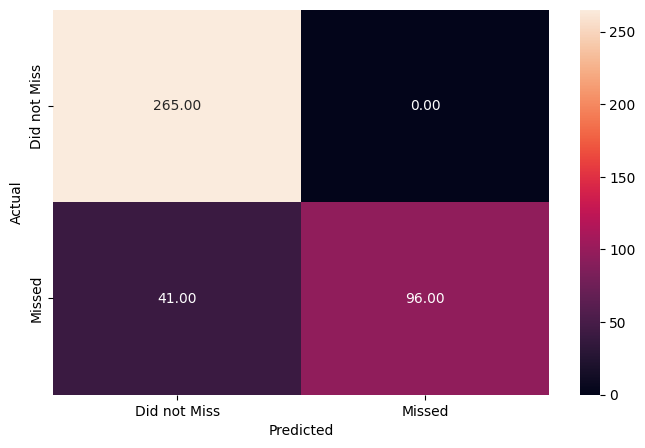

In [26]:
# Checking performance on the training data
y_pred_train_rf_tuned = rf_tuned.predict(x_train)

metrics_score(y_train, y_pred_train_rf_tuned)

In [27]:
rf_estimator_tuned_train = model_performance_classification(rf_tuned, x_train, y_train)
rf_estimator_tuned_train

,Precision,Recall,Accuracy
0,0.933007,0.850365,0.89801


              precision    recall  f1-score   support

         0.0       0.71      0.94      0.81       114
         1.0       0.68      0.25      0.37        59

    accuracy                           0.71       173
   macro avg       0.70      0.60      0.59       173
weighted avg       0.70      0.71      0.66       173



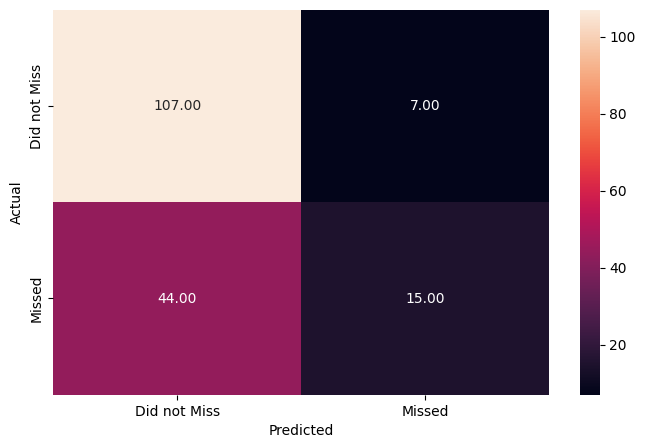

In [28]:
# Checking performance on the testing data
y_pred_test_rf_tuned = rf_tuned.predict(x_test)

metrics_score(y_test, y_pred_test_rf_tuned)

In [29]:
rf_estimator_tuned_test = model_performance_classification(rf_tuned, x_test, y_test)
rf_estimator_tuned_test

,Precision,Recall,Accuracy
0,0.695214,0.596417,0.705202


<Axes: xlabel='Importance'>

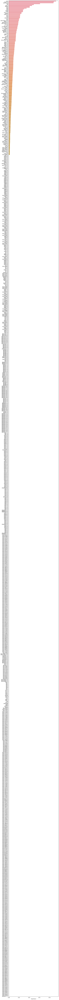

In [28]:
# Plotting feature importance
importances = rf_tuned.feature_importances_

columns = X_encoded.columns

importance_df = pd.DataFrame(importances, index = columns, columns = ['Importance']).sort_values(by = 'Importance', ascending = False)

plt.figure(figsize = (10, 200))

sns.barplot(x= importance_df.Importance, y= importance_df.index)

In [29]:
sorted_idx = np.argsort(rf_tuned.feature_importances_)[::-1]
for index in sorted_idx:
    print([x_train.columns[index], rf_tuned.feature_importances_[index]])

['Q19', 0.046462171456853316]
['duration', 0.04424281199664752]
['Q10bin_1.0', 0.04385863411896865]
['Q58', 0.03066614761942817]
['Q2', 0.024585144638846496]
['Q44_2', 0.022773782096322866]
['Q59bin', 0.020612291833262335]
['Q22', 0.020533533346223976]
['Q35', 0.017440564691447884]
['Q30', 0.015058033968782619]
['Q29', 0.014002547343022396]
['ppage', 0.013969458620664007]
['Q27', 0.013831279048857874]
['Q42e_1.0', 0.012533255595916665]
['weight', 0.012415990627761388]
['Q38b_0.0', 0.011259120899980884]
['Q23', 0.011195019429597986]
['Q24', 0.010998883516938835]
['Q20', 0.01094610963580168]
['Q46_5.0', 0.010936197860235189]
['Q52', 0.010053216353537526]
['Q21', 0.010041881283926479]
['DeviceType_10.0', 0.00985842021384543]
['Q45g_2.0', 0.009513491464195552]
['ppincimp_4.0', 0.009417902306138296]
['ppincimp_14.0', 0.009286313615960643]
['Q46_3.0', 0.009227137202117434]
['Q31', 0.009002147125219205]
['Q36a_1.0', 0.008723516456443512]
['ppstaten_86.0', 0.008555893509834843]
['Q37_1.0', 0.0